In [1]:
import sys
sys.path.append("/home/chameleon/Work/Lab/env/lib/python3.10/site-packages")

from typing import List, Tuple
from scipy import signal

import skimage
import numpy as np
import matplotlib.pyplot as plt
%matplotlib widget

In [2]:
def plot_imgs(imgs: List[Tuple[np.array, str]]) -> None:
    '''
    Displays images with captions.
    - imgs: List of tuples of image and caption to the image.
    '''
    if len(imgs) == 1:
        img, title = imgs[0]
        plt.figure(figsize=(5, 5))
        plt.imshow(img, cmap='gray')
        plt.title(title)
        plt.show()
    else:
        fig, axarr = plt.subplots(len(imgs), 1, figsize=(30, 30))

        for index, data in enumerate(imgs):
            img, title = data
            axarr[index].imshow(img, cmap='gray')
            axarr[index].set_title(title)
        
        fig.tight_layout()


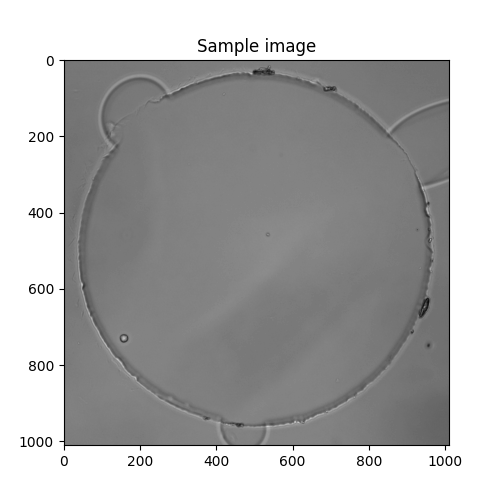

In [3]:
# Reading the image
img = skimage.io.imread("/home/chameleon/Work/Lab/BF-C2DL-HSC/01/t0200.tif") / 255.0

plot_imgs([(img, "Sample image")])

In [4]:
def total_variation(image: np.array) -> float:
    '''
    Computing Total Variation by the formula:
        TV(X) = \Sum_{i, j \in N}||x_i - x_j||^q_p

    were ||x||^q_p is the l_p norm to the power of q.

    In this case the l_1 norm is used.
    '''
    return np.sum((image[1:, :] - image[:-1, :]) ** 2) + np.sum((image[:, 1:] - image[:, :-1]) ** 2)

def entropy_tv(img: np.array) -> None:
    '''
    Printing shannon entropy and Total Variation of the image.
    '''

    # Calculating the Shannon entropy of an image
    shannon_entropy = skimage.measure.shannon_entropy(img)
    print(f"Shannon entropy: {shannon_entropy}.")

    # Calculating Total Variation of an image
    tv = total_variation(img)
    print(f"Total variation: {tv}.")

def get_kernel(size: int = 5, sigma: int = 10) -> np.array:
    '''
    Helper function that calculates a kernel for gaussian blur.
    '''
    kernel = signal.gaussian(size, sigma)
    kernel = np.outer(kernel, kernel)
    normalization = kernel.sum()
    return kernel / normalization

def blur(img: np.array, kernel: np.array = get_kernel()) -> np.array:
    '''
    Blurring the image using defined kernel.
    '''
    return signal.convolve2d(img, kernel)

def gaussian_noise(img: np.array, loc: float=0.0, std: float=5e-2) -> np.array:
    '''
    Adding normally distributed noise to the image.
    '''
    return np.clip(img + np.random.normal(loc, std, img.shape[::-1]), 0, 1)

def poisson_noise(img: np.array) -> np.array:
    '''
    Adding noise with poisson distribution to the image.
    '''
    return np.clip(img + np.random.poisson(img), 0, 1)

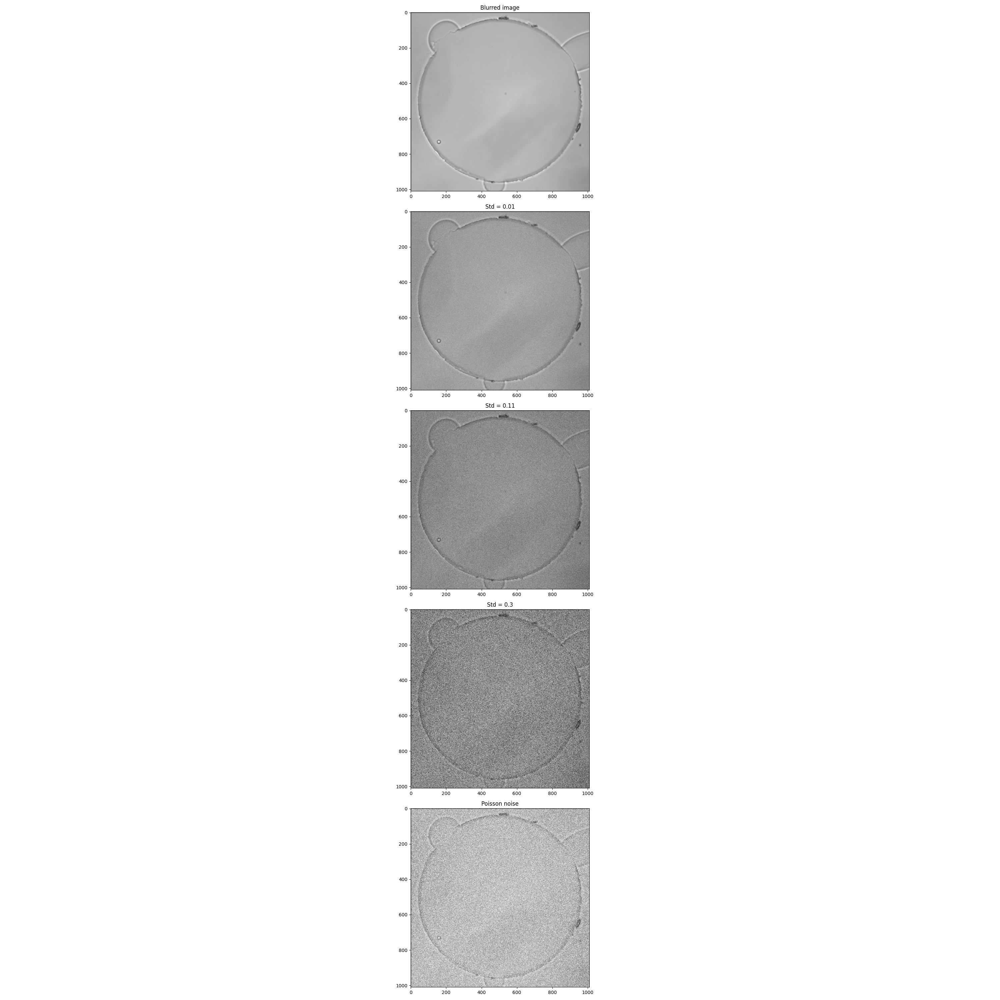

In [5]:
# Adding blur to the image
kernel = get_kernel()
blurred = blur(img, kernel)[:-4, :-4]
skimage.io.imsave("results/blur/blurred.tif", blurred)

# Adding gaussian noise to the image
g_noise_low = gaussian_noise(blurred, std=0.05)
g_noise_mid = gaussian_noise(blurred, std=0.11)
g_noise_high = gaussian_noise(blurred, std=0.3)

skimage.io.imsave("results/noise/g_noise_low.tif", g_noise_low)
skimage.io.imsave("results/noise/g_noise_mid.tif", g_noise_mid)
skimage.io.imsave("results/noise/g_noise_high.tif", g_noise_high)

# Adding poisson noise to the image
p_noise = poisson_noise(blurred)

skimage.io.imsave("results/noise/p_noise.tif", p_noise)

plot_imgs([(blurred, "Blurred image"), (g_noise_low, "Std = 0.01"), (g_noise_mid, "Std = 0.11"), (g_noise_high, "Std = 0.3"), (p_noise, "Poisson noise")])

In [6]:
print("Sample image")
entropy_tv(img)
print("\nBlurred image")
entropy_tv(blurred)
print("\nLow gaussian noise image")
entropy_tv(g_noise_low)
print("\nMid gaussian noise image")
entropy_tv(g_noise_mid)
print("\nHigh gaussian noise image")
entropy_tv(g_noise_high)
print("\nPoisson noise image")
entropy_tv(p_noise)

Sample image
Shannon entropy: 4.830312996532502.
Total variation: 150.81270280661278.

Blurred image
Shannon entropy: 19.436033287319322.
Total variation: 127.09312122989323.

Low gaussian noise image
Shannon entropy: 19.96012230791036.
Total variation: 10301.327162196354.

Mid gaussian noise image
Shannon entropy: 19.95664485568117.
Total variation: 49365.02141319688.

High gaussian noise image
Shannon entropy: 18.377449618748617.
Total variation: 304315.74776926346.

Poisson noise image
Shannon entropy: 12.009324579544552.
Total variation: 212417.37924530846.


In [7]:
# Restoration of the images using unsupervised Wiener deconvolution
unblurred_w, _ = skimage.restoration.unsupervised_wiener(blurred, kernel, clip=False)
unblurred_w_low_noise, _ = skimage.restoration.unsupervised_wiener(g_noise_low, kernel)
unblurred_w_mid_noise, _ = skimage.restoration.unsupervised_wiener(g_noise_mid, kernel)
unblurred_w_high_noise, _ = skimage.restoration.unsupervised_wiener(g_noise_high, kernel)
unblurred_w_p_noise, _ = skimage.restoration.unsupervised_wiener(p_noise, kernel)

skimage.io.imsave("results/wiener/unblurred_w.tif", unblurred_w)
skimage.io.imsave("results/wiener/unblurred_w_low_noise.tif", unblurred_w_low_noise)
skimage.io.imsave("results/wiener/unblurred_w_mid_noise.tif", unblurred_w_mid_noise)
skimage.io.imsave("results/wiener/unblurred_w_high_noise.tif", unblurred_w_high_noise)
skimage.io.imsave("results/wiener/unblurred_w_p_noise.tif", unblurred_w_p_noise)

# Restoration of the images using Richardson-Lucy deconvolution
unblurred_rl = skimage.restoration.richardson_lucy(blurred, kernel, clip=False)
unblurred_rl_low_noise = skimage.restoration.richardson_lucy(g_noise_low, kernel)
unblurred_rl_mid_noise = skimage.restoration.richardson_lucy(g_noise_mid, kernel)
unblurred_rl_high_noise = skimage.restoration.richardson_lucy(g_noise_high, kernel)
unblurred_rl_p_noise = skimage.restoration.richardson_lucy(p_noise, kernel)

skimage.io.imsave("results/richardsonlucy/unblurred_rl.tif", unblurred_rl)
skimage.io.imsave("results/richardsonlucy/unblurred_rl_low_noise.tif", unblurred_rl_low_noise)
skimage.io.imsave("results/richardsonlucy/unblurred_rl_mid_noise.tif", unblurred_rl_mid_noise)
skimage.io.imsave("results/richardsonlucy/unblurred_rl_high_noise.tif", unblurred_rl_high_noise)
skimage.io.imsave("results/richardsonlucy/unblurred_rl_p_noise.tif", unblurred_rl_p_noise)

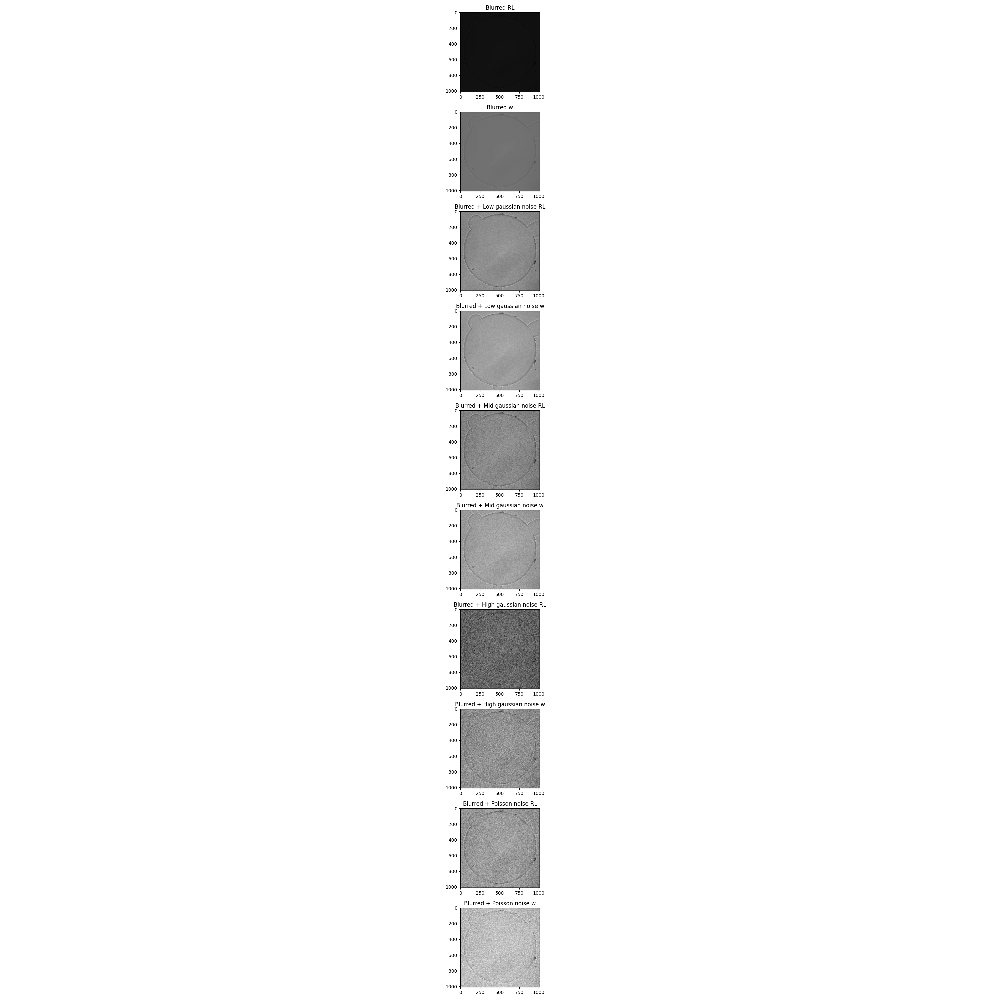

In [8]:
plot_imgs([
    (unblurred_rl, "Blurred RL"),
    (unblurred_w, "Blurred w"),
    (unblurred_rl_low_noise, "Blurred + Low gaussian noise RL"),
    (unblurred_w_low_noise, "Blurred + Low gaussian noise w"),
    (unblurred_rl_mid_noise, "Blurred + Mid gaussian noise RL"),
    (unblurred_w_mid_noise, "Blurred + Mid gaussian noise w"),
    (unblurred_rl_high_noise, "Blurred + High gaussian noise RL"),
    (unblurred_w_high_noise, "Blurred + High gaussian noise w"),
    (unblurred_rl_p_noise, "Blurred + Poisson noise RL"),
    (unblurred_w_p_noise, "Blurred + Poisson noise w"),
])

In [9]:
print(f"Unblurred image using Richardson-Lucy's SSIM is {skimage.metrics.structural_similarity(img, unblurred_rl)} and PSNR is {skimage.metrics.peak_signal_noise_ratio(img, unblurred_rl)}")
print(f"Unblurred image using Wiener's SSIM is {skimage.metrics.structural_similarity(img, unblurred_w)} and PSNR is {skimage.metrics.peak_signal_noise_ratio(img, unblurred_w)}")
print(f"Unblurred low noise image using Richardson-Lucy's SSIM is {skimage.metrics.structural_similarity(img, unblurred_rl_low_noise)} and PSNR is {skimage.metrics.peak_signal_noise_ratio(img, unblurred_rl_low_noise)}")
print(f"Unblurred low noise image Wiener's SSIM is {skimage.metrics.structural_similarity(img, unblurred_w_low_noise)} and PSNR is {skimage.metrics.peak_signal_noise_ratio(img, unblurred_w_low_noise)}")
print(f"Unblurred mid noise image Richardson-Lucy's SSIM is {skimage.metrics.structural_similarity(img, unblurred_rl_mid_noise)} and PSNR is {skimage.metrics.peak_signal_noise_ratio(img, unblurred_rl_mid_noise)}")
print(f"Unblurred mid noise image Wiener's SSIM is {skimage.metrics.structural_similarity(img, unblurred_w_mid_noise)} and PSNR is {skimage.metrics.peak_signal_noise_ratio(img, unblurred_w_mid_noise)}")
print(f"Unblurred high noise image Richardson-Lucy's SSIM is {skimage.metrics.structural_similarity(img, unblurred_rl_high_noise)} and PSNR is {skimage.metrics.peak_signal_noise_ratio(img, unblurred_rl_high_noise)}")
print(f"Unblurred high noise image Wiener's SSIM is {skimage.metrics.structural_similarity(img, unblurred_w_high_noise)} and PSNR is {skimage.metrics.peak_signal_noise_ratio(img, unblurred_w_high_noise)}")
print(f"Unblurred Poisson noise image Richardson-Lucy's SSIM is {skimage.metrics.structural_similarity(img, unblurred_rl_p_noise)} and PSNR is {skimage.metrics.peak_signal_noise_ratio(img, unblurred_rl_p_noise)}")
print(f"Unblurred Poisson noise image Wiener's SSIM is {skimage.metrics.structural_similarity(img, unblurred_w_p_noise)} and PSNR is {skimage.metrics.peak_signal_noise_ratio(img, unblurred_w_p_noise)}")

Unblurred image using Richardson-Lucy's SSIM is 0.9462706727987859 and PSNR is 20.06205717233567
Unblurred image using Wiener's SSIM is 0.6795690466069612 and PSNR is 18.02852977538967
Unblurred low noise image using Richardson-Lucy's SSIM is 0.1810528690604178 and PSNR is 16.770467061586082
Unblurred low noise image Wiener's SSIM is 0.7073170590743663 and PSNR is 25.345762643441837
Unblurred mid noise image Richardson-Lucy's SSIM is 0.058636077305740913 and PSNR is 11.927307529161917
Unblurred mid noise image Wiener's SSIM is 0.5445991046542367 and PSNR is 23.35989672004708
Unblurred high noise image Richardson-Lucy's SSIM is 0.025985234079282417 and PSNR is 8.08279426451586
Unblurred high noise image Wiener's SSIM is 0.34273440336812866 and PSNR is 19.75823507855357
Unblurred Poisson noise image Richardson-Lucy's SSIM is 0.03553179039723109 and PSNR is 9.734909659005432
Unblurred Poisson noise image Wiener's SSIM is 0.3611110021835601 and PSNR is 13.461383559301774
